# Principle Component Analysis part 2 

### Digit Recognizer 

In [27]:
import pandas as pd
import numpy as np

In [28]:
df = pd.read_csv('train.csv')

In [29]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [30]:
df.shape

(42000, 785)

In [31]:
import matplotlib.pyplot as plt

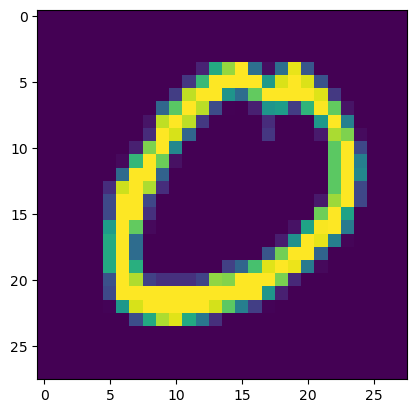

In [32]:
plt.imshow(df.iloc[13051,1:].values.reshape(28,28))

In [33]:
X = df.drop('label',axis =1)
y =df['label']

In [34]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [35]:
from sklearn.neighbors import KNeighborsClassifier

In [36]:
knn = KNeighborsClassifier()

In [37]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [38]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

13.667335271835327


In [39]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [40]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [41]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### PCA

In [42]:
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [43]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [44]:
knn = KNeighborsClassifier()
knn.fit(X_train_trf,y_train)
y_pred = knn.predict(X_test_trf)

In [45]:
accuracy_score(y_test,y_pred)

0.9507142857142857

In [46]:
for i in range(1,785,10):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    knn = KNeighborsClassifier()
    knn.fit(X_train_trf,y_train)
    y_pred = knn.predict(X_test_trf)
    print(accuracy_score(y_test,y_pred))

0.2580952380952381
0.9116666666666666
0.9438095238095238
0.9507142857142857
0.9522619047619048
0.9545238095238096
0.9547619047619048
0.9547619047619048
0.9551190476190476
0.9551190476190476
0.9542857142857143
0.9530952380952381
0.9533333333333334
0.9526190476190476
0.9522619047619048
0.9515476190476191
0.9521428571428572
0.9515476190476191
0.9513095238095238
0.9513095238095238
0.950595238095238
0.9495238095238095
0.9494047619047619
0.9491666666666667
0.9486904761904762
0.9485714285714286
0.9477380952380953
0.9470238095238095
0.9470238095238095
0.9472619047619047
0.9467857142857142
0.9465476190476191
0.9458333333333333
0.9458333333333333
0.9447619047619048
0.9445238095238095
0.9438095238095238
0.9438095238095238
0.9438095238095238
0.9439285714285715
0.9434523809523809
0.9430952380952381
0.9430952380952381
0.9429761904761905
0.9428571428571428
0.9422619047619047
0.9421428571428572
0.9420238095238095
0.9419047619047619
0.9411904761904762
0.9410714285714286
0.9410714285714286
0.94071428571

In [47]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [48]:
X_train_trf

array([[-2.71863253, -0.48982409],
       [-0.67698015, -6.75362491],
       [-3.03323281,  6.50981624],
       ...,
       [ 2.14883643,  0.78079444],
       [ 1.05957006,  0.94767312],
       [17.70258446,  1.96188185]])

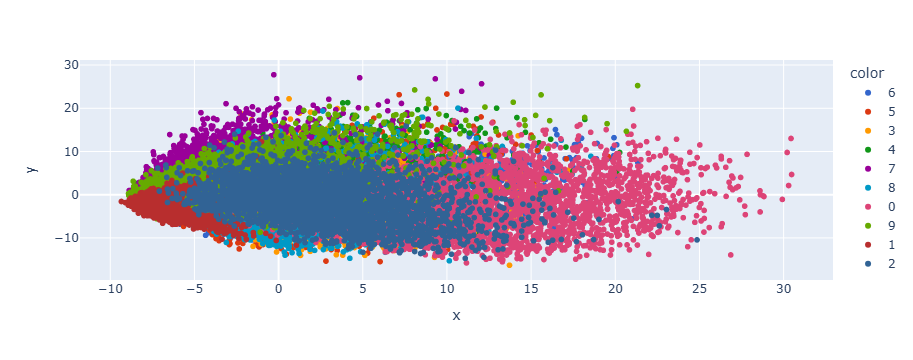

In [49]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [50]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [51]:
X_train_trf

array([[-2.71863253, -0.48982409,  1.1354966 ],
       [-0.67698015, -6.75362491, -2.33590139],
       [-3.03323281,  6.50981624,  7.49182983],
       ...,
       [ 2.14883643,  0.78079444, -0.74738774],
       [ 1.05957006,  0.94767312,  3.94973114],
       [17.70258446,  1.96188185, -4.94352837]])

In [52]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [53]:
# eigen values

pca.explained_variance_

array([40.67111198, 29.17023401, 26.74459621])

In [54]:
# eigen vectors

pca.components_.shape

(3, 784)

In [55]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [56]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [57]:
pca.explained_variance_.shape

(784,)

In [58]:
pca.components_.shape

(784, 784)

In [59]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

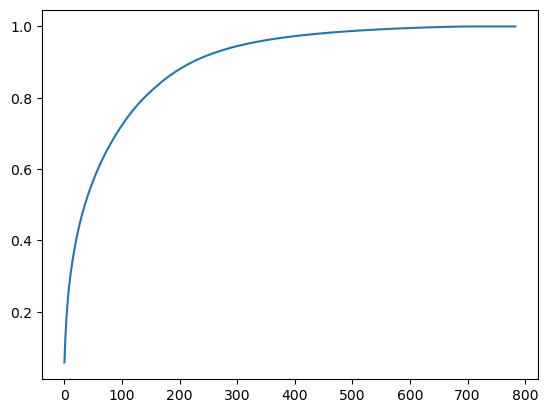

In [60]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))